In [1]:
import os
import numpy as np
from tqdm import tqdm
from scipy.stats import norm
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False


In [2]:
def gaussian_samples(K):
    d = 4
    stds = np.array([1, 2, 4, 8])
    mean = np.zeros(d)
    Z = np.random.randn(d, K)
    Y = mean[:, None] + stds[:, None] * Z
    return Y

In [3]:
# max_abs_list = np.zeros(100)
# max_list = np.zeros(100)
# for i in tqdm(range(100)):
#     samples = gaussian_samples(1000000)
#     max_abs_list[i] = np.mean(np.max(np.abs(samples), axis = 0))
#     max_list[i] = np.mean(np.max(samples, axis = 0))
max_abs_std = 0.003983079857045259    #np.std(max_abs_list)
max_std = 0.004346037454060176        #np.std(max_list)
max_abs = 7.217249480359102           #np.mean(max_abs_list)
max_ = 4.501270722688794              #np.mean(max_list)

In [4]:
firstmoment_abs = (1+2+4+8)*np.sqrt(2/np.pi)
secondmoment = 85
p_y0_gt_1 = norm.sf(1)
p_y0_gt_2 = norm.sf(2)
p_y3_gt_8 = norm.sf(1)
p_y3_gt_16 = norm.sf(2)

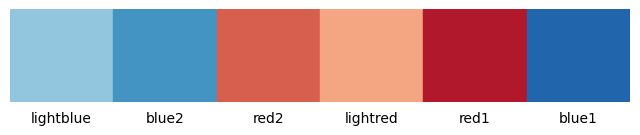

In [5]:
def show_palette(colors, labels=None, figsize=(8, 1.2)):
    n = len(colors)
    fig, ax = plt.subplots(figsize=figsize)

    # Draw color blocks
    for i, c in enumerate(colors):
        ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=c))
        if labels:
            ax.text(i + 0.5, -0.1, labels[i], ha="center", va="top", fontsize=10)

    ax.set_xlim(0, n)
    ax.set_ylim(0, 1)
    ax.axis("off")
    plt.show()
    
colors = [
    "#92c5de",
    "#4393c3",
    "#d6604d",
    "#f4a582",
    "#b2182b",
    "#2166ac"
]

styles = [
    {"style": "--", "marker": "o"},
    {"style": "--", "marker": "s"},
    {"style": "--", "marker": "^"},
    {"style": "--", "marker": "v"},
    {"style": "--", "marker": "*"},
    {"style": "--", "marker": "D"},
]

labels = ["lightblue", "blue2", "red2", "lightred", "red1", "blue1"]

show_palette(colors, labels)

In [6]:
def plot_statistics(stats_list, ground_truth, h_list, methods, name, style_list = styles, color_dic = colors, std2 = None):
    data_list = stats_list-ground_truth
    MSE_list = np.zeros((len(h_list), len(methods)))
    Biassq_list = np.zeros((len(h_list), len(methods)))
    Var_list = np.zeros((len(h_list), len(methods)))
    for index, h in enumerate(h_list): # stepsize
        data = data_list[index]
        for index2, estimator in enumerate(data): # methods
            MSE_list[index, index2] = np.mean((estimator) ** 2)
            Biassq_list[index, index2] = np.mean(estimator) ** 2
            Var_list[index, index2] = np.var(estimator)
                
    plt.figure(figsize=(18,4), dpi=300)
    plt.subplot(1,3,1)
    for index, stats in enumerate(MSE_list.T): 
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"], 
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel('MSE', fontsize=16)
    # plt.title('MSE', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.subplot(1,3,2)
    for index, stats in enumerate(Biassq_list.T): 
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    if std2:
        plt.axhline(y=std2, color='r', linestyle='--', label='Threshold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel(r'Bias$^2$', fontsize=16)
    # plt.title(r'Bias$^2$', fontsize=16)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.subplot(1,3,3)
    for index, stats in enumerate(Var_list.T):
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel('Var', fontsize=16)
    # plt.title('Var', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    # plt.rcParams['text.usetex'] = True
    plt.suptitle(name, y=1., fontsize=18)
    plt.show()
    return

## fixed number of total budget (number of steps), K = 100000, nonadaptive

In [138]:
# load 8 statistics from storage, nonadaptive
data = []
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
h_list = [0.02, 0.04, 0.08, 0.12, 0.16, 0.2, 0.24, 0.28, 0.32, 0.4]
K = 100000
M = 512
path = 'results/Jun_23_fixbudget/'
for i, h in enumerate(h_list):
    filename = f'statsY_list_K{K}_M{M}_h{h}.npy'
    data_i = np.load(os.path.join(path, filename), allow_pickle=True)
    data.append(data_i)
data = np.array(data)
print(data.shape)
print(data[0].shape) # (10 step sizes, 6 methods, 18 repeated chains, 10 subchains, 8 statistics)

(10, 6, 512, 10, 8)
(6, 512, 10, 8)


In [145]:
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3)
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3)
print(firstmoment_abs_list.shape)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3)
max_list = np.mean(data[:,:,:,:,3], axis=3)
p_y0_gt_1_list = np.mean(data[:,:,:,:,4], axis=3)
p_y0_gt_2_list = np.mean(data[:,:,:,:,5], axis=3)
p_y3_gt_8_list = np.mean(data[:,:,:,:,6], axis=3)
p_y3_gt_16_list = np.mean(data[:,:,:,:,7], axis=3)

(10, 6, 512)


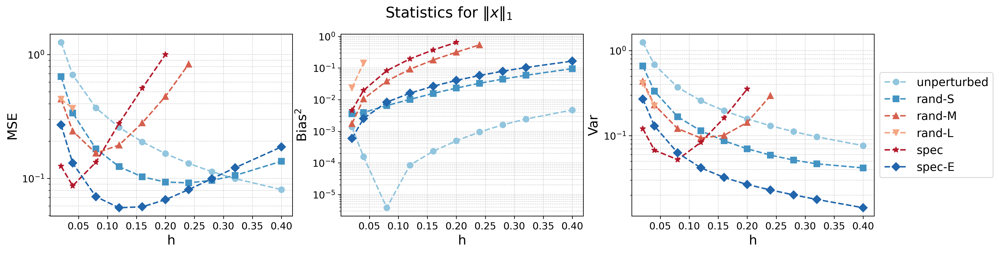

In [128]:
name = r'Statistics for $\|x\|_1$'
firstmoment_abs_list[firstmoment_abs_list > 100] = np.nan
plot_statistics(firstmoment_abs_list, firstmoment_abs, h_list, methods, name)

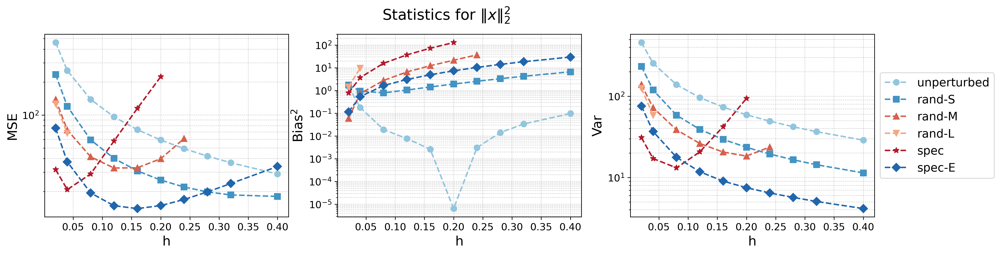

In [129]:
name = r'Statistics for $\|x\|^2_2$'
secondmoment_list[secondmoment_list > 1000] = np.nan
plot_statistics(secondmoment_list, secondmoment, h_list, methods, name)

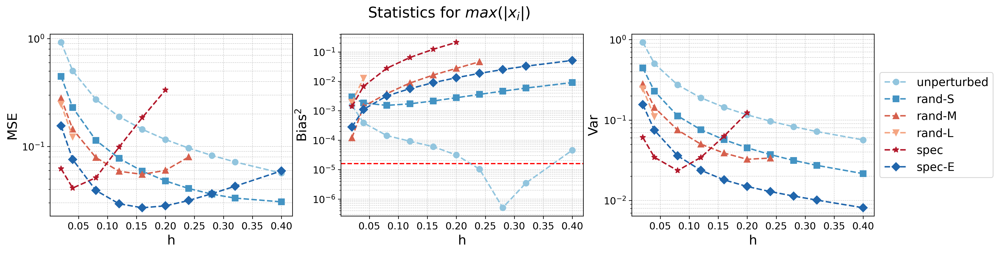

In [130]:
name = r'Statistics for $max(|x_i|)$'
max_abs_list[max_abs_list > 100] = np.nan
plot_statistics(max_abs_list, max_abs, h_list, methods, name, std2 = max_abs_std**2)

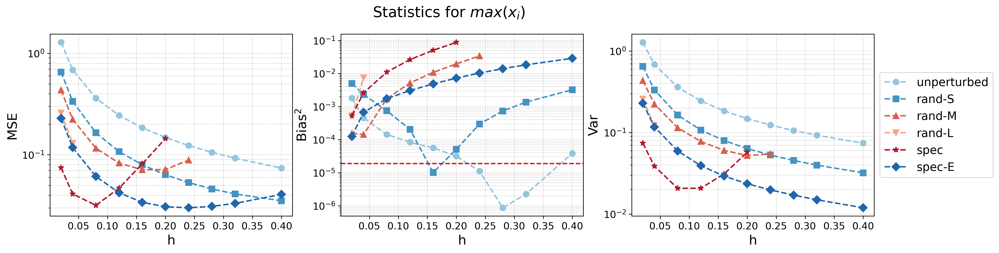

In [140]:
name = r'Statistics for $max(x_i)$'
max_list[max_list > 500] = np.nan
plot_statistics(max_list, max_, h_list, methods, name, std2 = max_std**2)

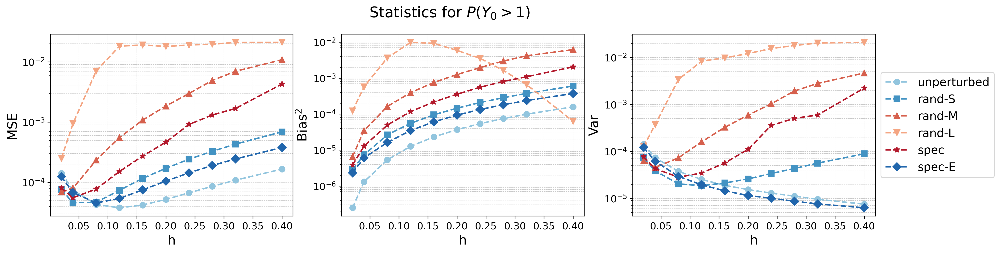

In [141]:
name = r'Statistics for $P(Y_0>1)$'
p_y0_gt_1_list[p_y0_gt_1_list > 1] = np.nan
plot_statistics(p_y0_gt_1_list, p_y0_gt_1, h_list, methods, name)

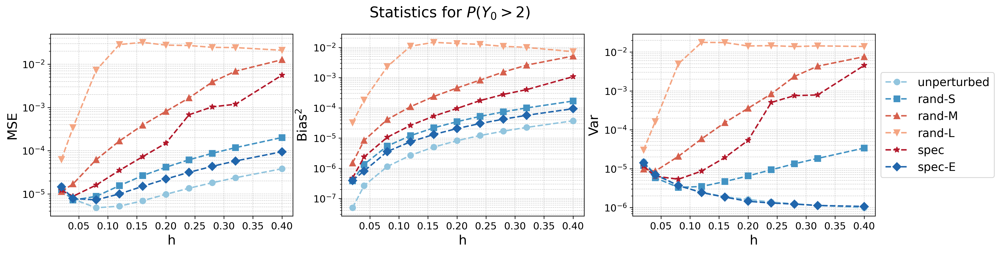

In [142]:
name = r'Statistics for $P(Y_0>2)$'
p_y0_gt_2_list[p_y0_gt_2_list > 0.5] = np.nan
plot_statistics(p_y0_gt_2_list, p_y0_gt_2, h_list, methods, name)

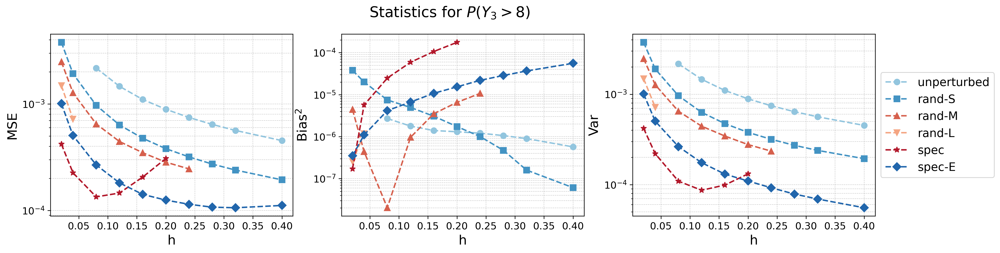

In [149]:
name = r'Statistics for $P(Y_3>8)$'
p_y3_gt_8_list[p_y3_gt_8_list > 0.4] = np.nan
plot_statistics(p_y3_gt_8_list, p_y3_gt_8, h_list, methods, name)

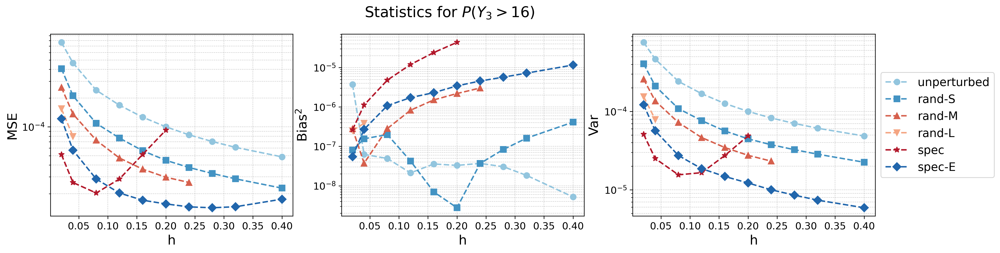

In [151]:
name = r'Statistics for $P(Y_3>16)$'
p_y3_gt_16_list[p_y3_gt_16_list > 0.3] = np.nan
plot_statistics(p_y3_gt_16_list, p_y3_gt_16, h_list, methods, name)

## fixed number of total time, T = 10000, nonadaptive

In [170]:
# load 8 statistics from storage, nonadaptive
data = []
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
h_list = [0.02, 0.04, 0.08, 0.12, 0.16, 0.2, 0.24, 0.28, 0.32, 0.4]
T = 10000
M = 1024
path = 'Jul_01_fixlength/'
for i, h in enumerate(h_list):
    filename = f'statsY_list_T{T}_M{M}_h{h}.npy'
    data_i = np.load(os.path.join(path, filename), allow_pickle=True)
    data.append(data_i)
data = np.array(data)
print(data.shape)
print(data[0].shape) # (10 step sizes, 6 methods, 18 repeated chains, 10 subchains, 8 statistics)

(10, 6, 1024, 10, 8)
(6, 1024, 10, 8)


In [165]:
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3)
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3)
print(firstmoment_abs_list.shape)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3)
max_list = np.mean(data[:,:,:,:,3], axis=3)
p_y0_gt_1_list = np.mean(data[:,:,:,:,4], axis=3)
p_y0_gt_2_list = np.mean(data[:,:,:,:,5], axis=3)
p_y3_gt_8_list = np.mean(data[:,:,:,:,6], axis=3)
p_y3_gt_16_list = np.mean(data[:,:,:,:,7], axis=3)

(10, 6, 1024)


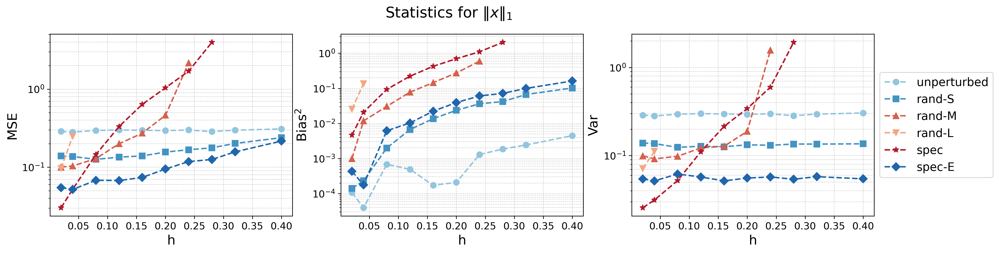

In [171]:
name = r'Statistics for $\|x\|_1$'
firstmoment_abs_list[firstmoment_abs_list > 100] = np.nan
plot_statistics(firstmoment_abs_list, firstmoment_abs, h_list, methods, name)

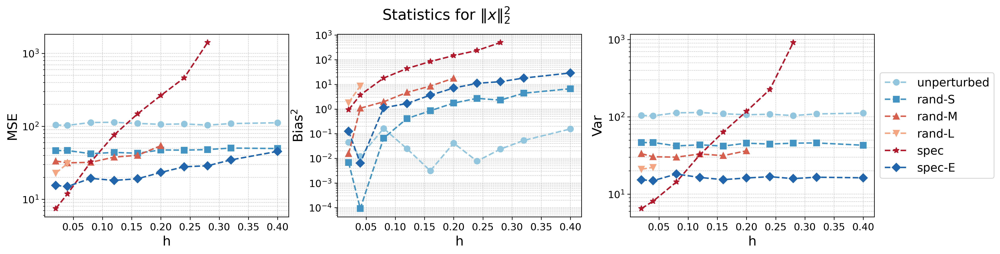

In [172]:
name = r'Statistics for $\|x\|^2_2$'
secondmoment_list[secondmoment_list > 1000] = np.nan
plot_statistics(secondmoment_list, secondmoment, h_list, methods, name)

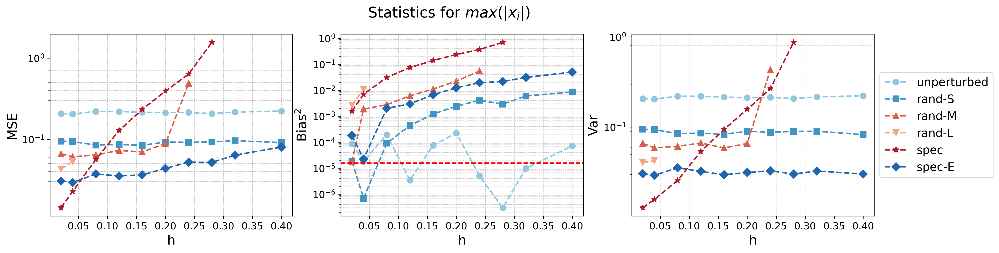

In [173]:
name = r'Statistics for $max(|x_i|)$'
max_abs_list[max_abs_list > 100] = np.nan
plot_statistics(max_abs_list, max_abs, h_list, methods, name, std2 = max_abs_std**2)

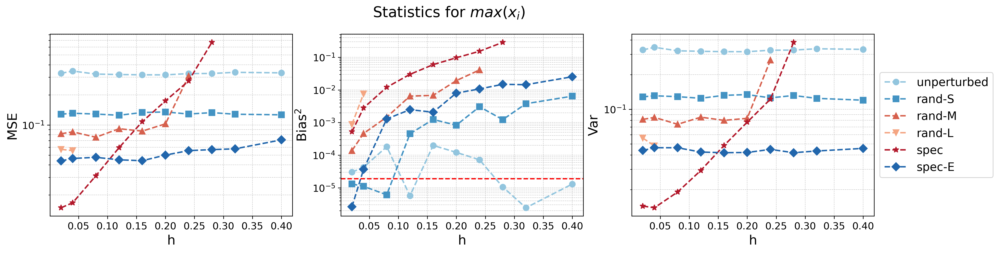

In [174]:
name = r'Statistics for $max(x_i)$'
max_list[max_list > 100] = np.nan
plot_statistics(max_list, max_, h_list, methods, name, std2 = max_std**2)

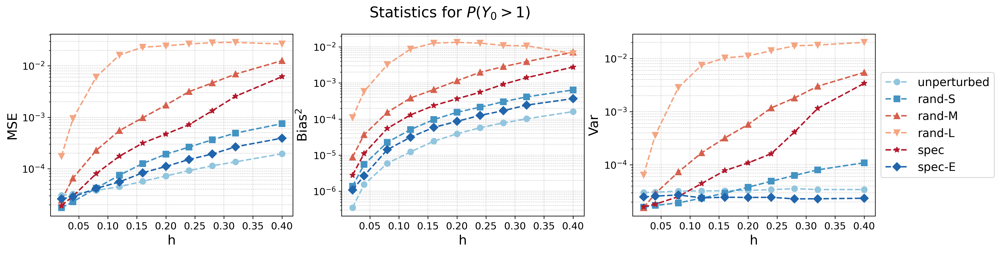

In [175]:
name = r'Statistics for $P(Y_0>1)$'
p_y0_gt_1_list[p_y0_gt_1_list > 1] = np.nan
plot_statistics(p_y0_gt_1_list, p_y0_gt_1, h_list, methods, name)

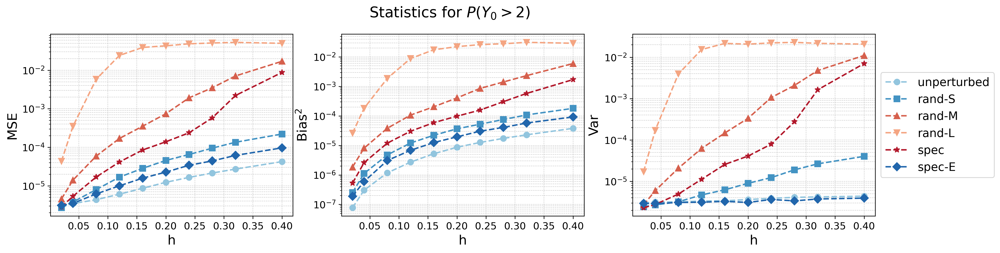

In [176]:
name = r'Statistics for $P(Y_0>2)$'
p_y0_gt_2_list[p_y0_gt_2_list > 1] = np.nan
plot_statistics(p_y0_gt_2_list, p_y0_gt_2, h_list, methods, name)

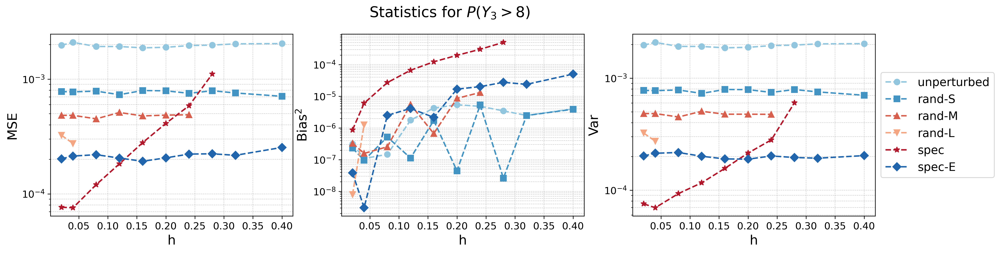

In [177]:
name = r'Statistics for $P(Y_3>8)$'
p_y3_gt_8_list[p_y3_gt_8_list > 0.4] = np.nan
plot_statistics(p_y3_gt_8_list, p_y3_gt_8, h_list, methods, name)

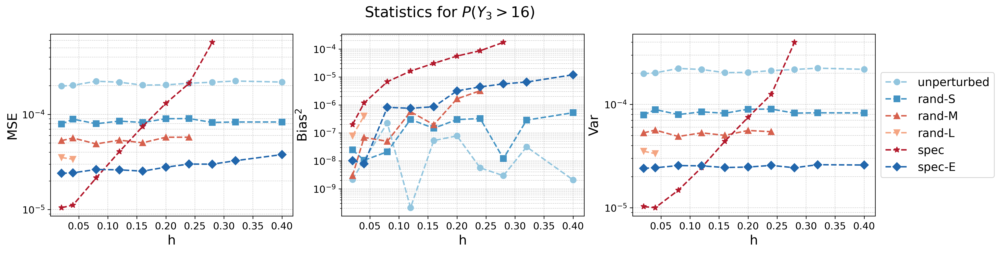

In [178]:
name = r'Statistics for $P(Y_3>16)$'
p_y3_gt_16_list[p_y3_gt_16_list > 0.4] = np.nan
plot_statistics(p_y3_gt_16_list, p_y3_gt_16, h_list, methods, name)

## convergence plotting of Fisher

In [8]:
# load 8 statistics from storage, nonadaptive
data = []
methods = ['JSJ', 'JSJS', 'JSSJ', 'adapt']
h_list = [0.1]
path = 'results/adapt_fixbudget/' # h, method, repeated chain, subchain, stats
fisher_err = []
for h in h_list:
    fisher_err.append(np.load(os.path.join(path, 'fisher_error_4D_Gaussian_K10000_M64_h'+str(h)+'.npy'), allow_pickle=True))
    data.append(np.load(os.path.join(path, 'statsY_list_K10000_M64_h'+str(h)+'.npy'), allow_pickle=True))
data = np.array(data)#.transpose(1, 0, 2, 3, 4)
print(data.shape)

(1, 4, 64, 10, 8)


In [9]:
fisher_err = np.array(fisher_err)
fisher_err = np.mean(fisher_err, axis = 1)

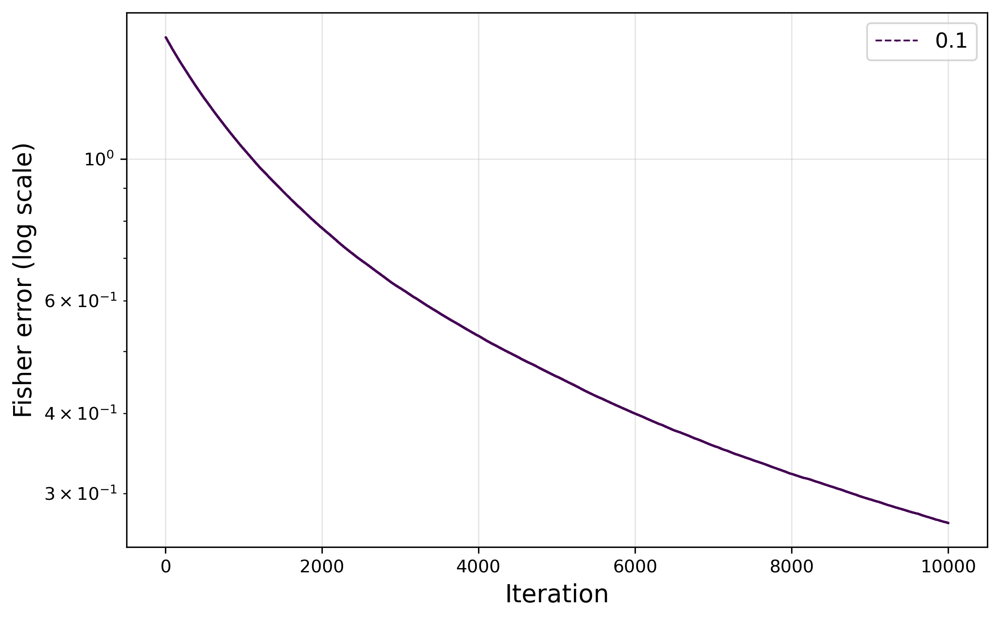

In [11]:
import matplotlib.cm as cm
plt.figure(figsize=(8,5), dpi = 300)
colors = cm.viridis(np.linspace(0, 1, 10))
for i in range(1):
    plt.semilogy(fisher_err[i,:], '--o', label = h_list[i], color=colors[i], linewidth=1, markersize=.2)
plt.xlabel("Iteration", fontsize=14)
plt.ylabel("Fisher error (log scale)", fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

## fixed number of total time, K=10000, adaptive

In [50]:
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3)
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3)
print(firstmoment_abs_list.shape)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3)
max_list = np.mean(data[:,:,:,:,3], axis=3)
p_y0_gt_1_list = np.mean(data[:,:,:,:,4], axis=3)
p_y0_gt_2_list = np.mean(data[:,:,:,:,5], axis=3)
p_y3_gt_8_list = np.mean(data[:,:,:,:,6], axis=3)
p_y3_gt_16_list = np.mean(data[:,:,:,:,7], axis=3)

(10, 4, 512)


In [51]:
firstmoment_abs_list.shape

(10, 4, 512)

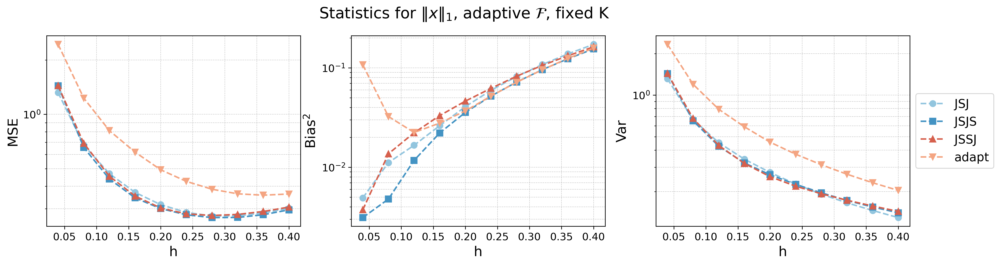

In [52]:
name = r'Statistics for $\|x\|_1$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(firstmoment_abs_list, firstmoment_abs, h_list, methods, name)

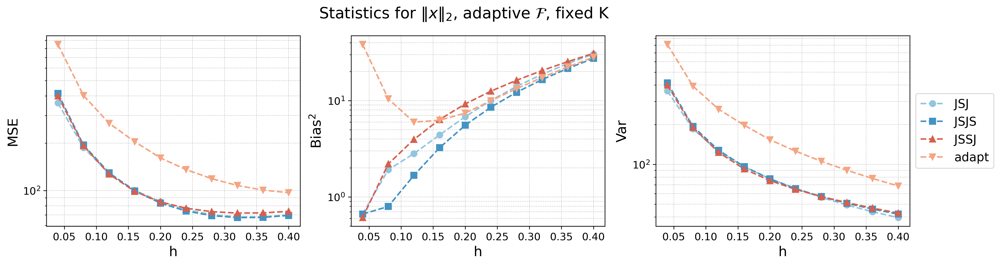

In [53]:
name = r'Statistics for $\|x\|_2$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(secondmoment_list, secondmoment, h_list, methods, name)

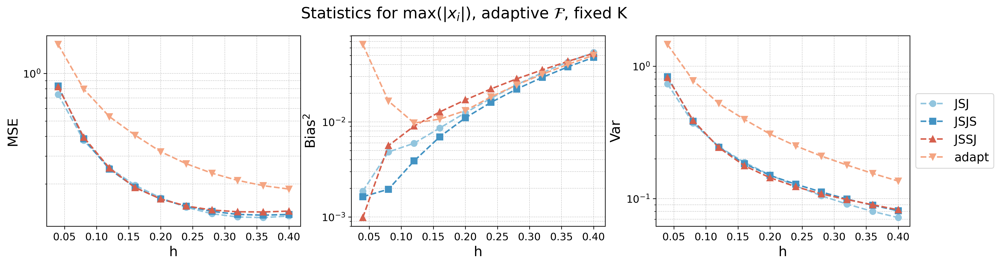

In [54]:
name = r'Statistics for $\max(|x_i|)$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(max_abs_list, max_abs, h_list, methods, name)

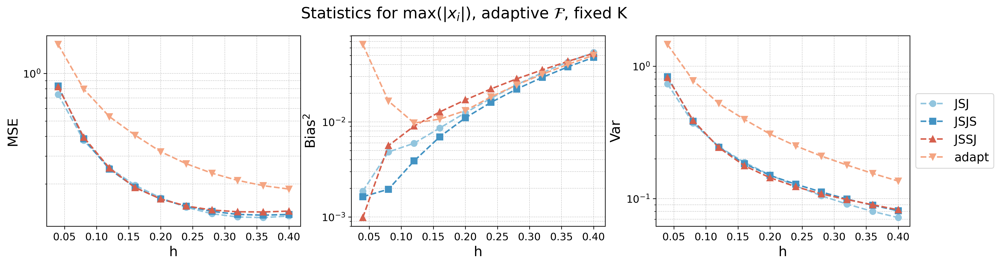

In [55]:
name = r'Statistics for $\max(|x_i|)$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(max_abs_list, max_abs, h_list, methods, name)

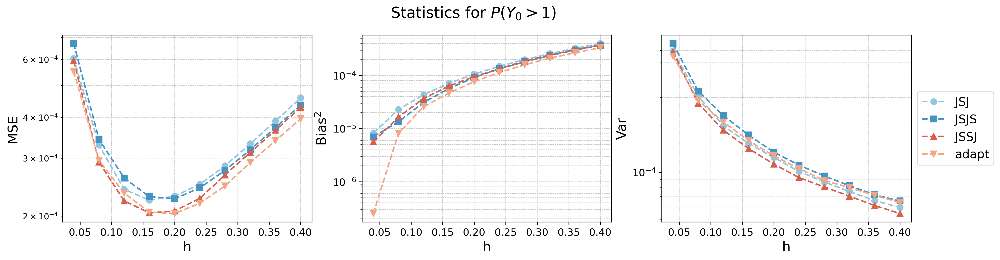

In [56]:
name = r'Statistics for $P(Y_0>1)$'
p_y0_gt_1_list[p_y0_gt_1_list > 1] = np.nan
plot_statistics(p_y0_gt_1_list, p_y0_gt_1, h_list, methods, name)

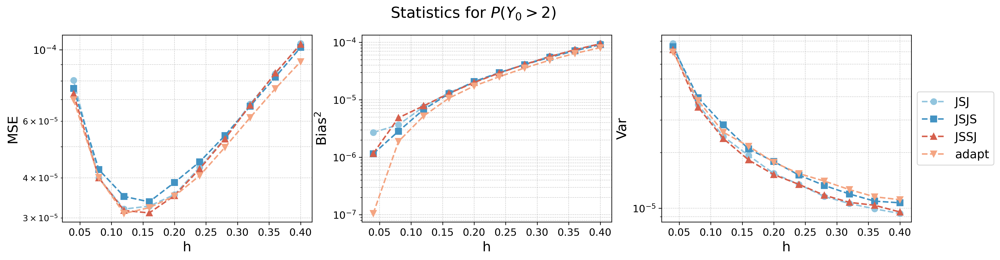

In [57]:
name = r'Statistics for $P(Y_0>2)$'
p_y0_gt_2_list[p_y0_gt_2_list > 1] = np.nan
plot_statistics(p_y0_gt_2_list, p_y0_gt_2, h_list, methods, name)

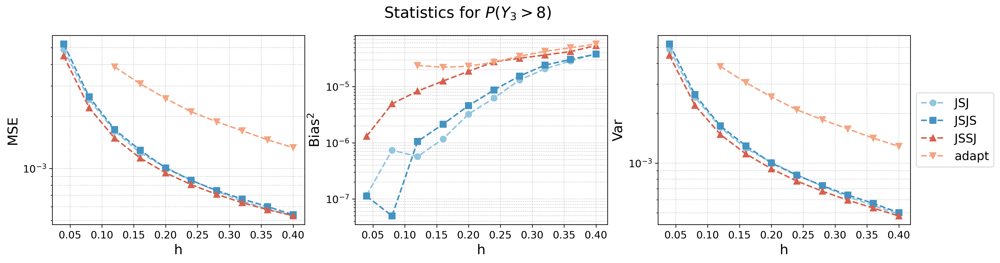

In [58]:
name = r'Statistics for $P(Y_3>8)$'
p_y3_gt_8_list[p_y3_gt_8_list > 0.4] = np.nan
plot_statistics(p_y3_gt_8_list, p_y3_gt_8, h_list, methods, name)

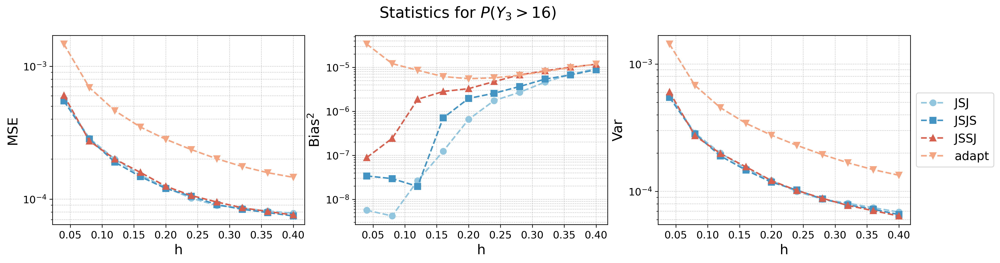

In [59]:
name = r'Statistics for $P(Y_3>16)$'
p_y3_gt_16_list[p_y3_gt_16_list > 0.4] = np.nan
plot_statistics(p_y3_gt_16_list, p_y3_gt_16, h_list, methods, name)

# nonadaptive vs adaptive

In [23]:
# separate 8 statistics
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3)
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3)
max_list = np.mean(data[:,:,:,:,3], axis=3)
thirdmoment_list = np.mean(data[:,:,:,:,4], axis=3)
fourthmoment_list = np.mean(data[:,:,:,:,5], axis=3)
exp4_list = np.mean(data[:,:,:,:,6], axis=3)
exp5_list = np.mean(data[:,:,:,:,7], axis=3)

In [24]:
max_abs = 7.216131728957761
max_ = 4.501671794362628
firstmoment_abs = (1+2+4+8)*np.sqrt(2/np.pi)
secondmoment = 85
exp4 = 77.48930068608837
exp5 = 24.754145039530336

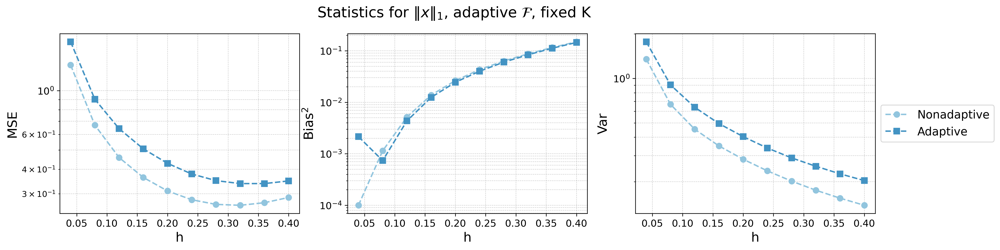

In [187]:
name = r'Statistics for $\|x\|_1$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(firstmoment_abs_list, firstmoment_abs, h_list, methods, name)

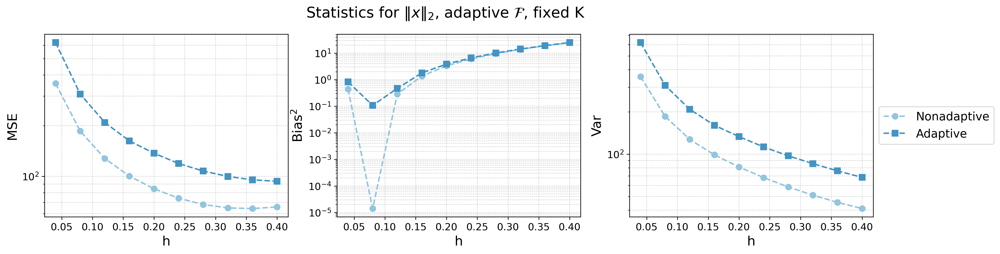

In [192]:
name = r'Statistics for $\|x\|_2$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(secondmoment_list, secondmoment, h_list, methods, name)

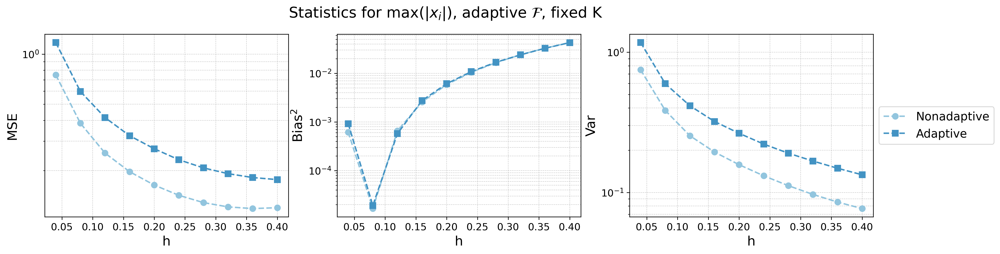

In [196]:
name = r'Statistics for $\max(|x_i|)$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(max_abs_list, max_abs, h_list, methods, name)

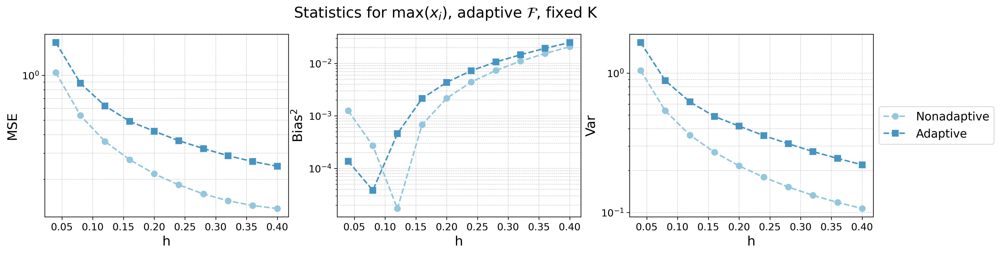

In [195]:
name = r'Statistics for $\max(x_i)$, adaptive $\mathcal{F}$, fixed K'
plot_statistics(max_list, max_, h_list, methods, name)

In [43]:
# load 8 statistics from storage, nonadaptive
methods = ['Nonadaptive', 'Adaptive']
h_list = [0.04, 0.08, 0.12, 0.16, 0.2, 0.24, 0.28, 0.32, 0.36, 0.4]
path = 'Sep_09_adapt_fixlength/' # h, method, repeated chain, subchain, stats
dataY, dataYadapt = [], []
for h in h_list:
    dataY.append(np.load(os.path.join(path, 'statsY_4D_Gaussian_T4000_M512_h'+str(h)+'.npy'), allow_pickle=True))
    dataYadapt.append(np.load(os.path.join(path, 'statsYadapt_4D_Gaussian_T4000_M512_h'+str(h)+'.npy'), allow_pickle=True))
data = np.array([np.array(dataY), np.array(dataYadapt)]).transpose(1, 0, 2, 3, 4)
print(data.shape)

(10, 2, 512, 10, 8)


In [44]:
# separate 8 statistics
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3)
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3)
max_list = np.mean(data[:,:,:,:,3], axis=3)
thirdmoment_list = np.mean(data[:,:,:,:,4], axis=3)
fourthmoment_list = np.mean(data[:,:,:,:,5], axis=3)
exp4_list = np.mean(data[:,:,:,:,6], axis=3)
exp5_list = np.mean(data[:,:,:,:,7], axis=3)

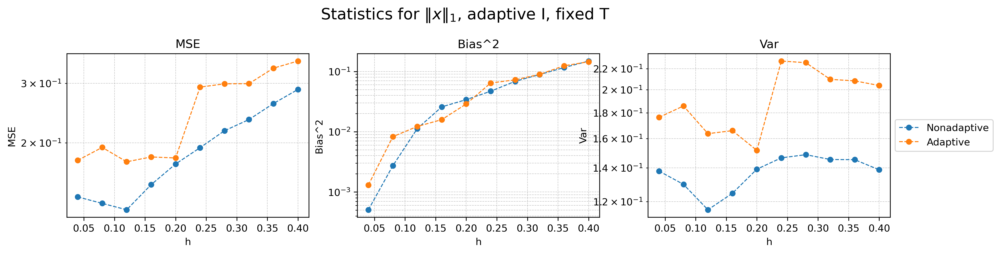

In [45]:
name = r'Statistics for $\|x\|_1$, adaptive I, fixed T'
plot_statistics(firstmoment_abs_list, firstmoment_abs, h_list, methods, name)

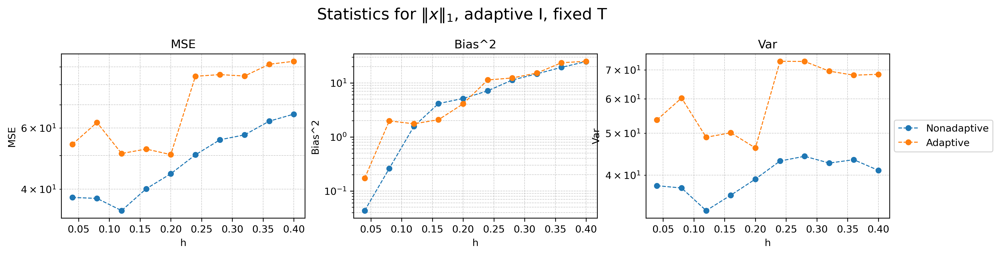

In [46]:
name = r'Statistics for $\|x\|_1$, adaptive I, fixed T'
plot_statistics(secondmoment_list, secondmoment, h_list, methods, name)

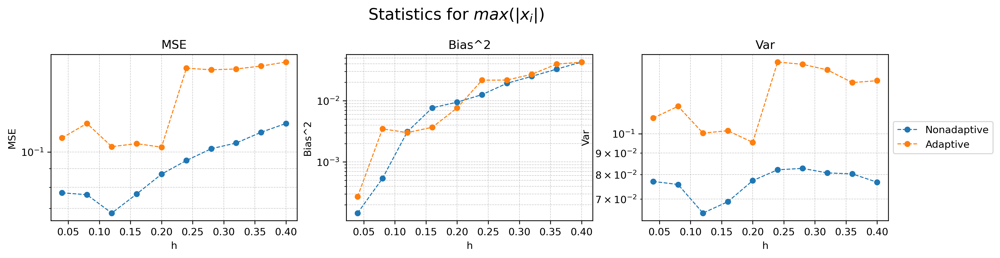

In [47]:
name = r'Statistics for $max(|x_i|)$'
plot_statistics(max_abs_list, max_abs, h_list, methods, name)

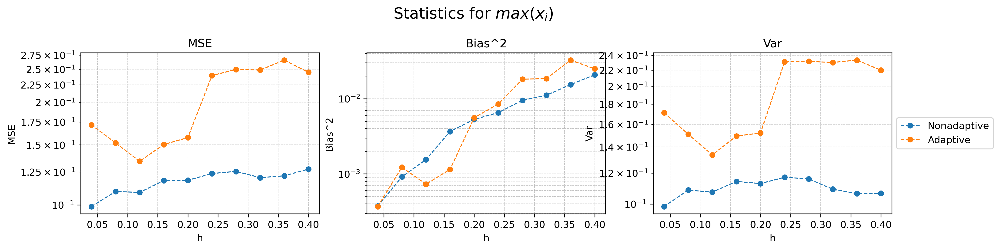

In [48]:
name = r'Statistics for $max(x_i)$'
plot_statistics(max_list, max_, h_list, methods, name)

In [70]:
# load 8 statistics from storage, nonadaptive
data_list = []
methods = ['Standard', 'RM', 'irr', 'nopt', 'opt']
h_list = [0.01, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2]
for method in ['Standard', 'RM', 'irr', 'nopt', 'opt']:
    path = 'results/May_11_adapt_fixbudget_8stats/'+method+'/'
    data = []
    for h in h_list:
        data.append(np.load(os.path.join(path, 'Y_4D_Gaussian_K1000000_M128_h'+str(h)+'.npy'), allow_pickle=True))
    data_list.append(data)
data = np.array(data_list).transpose(1, 0, 2, 3, 4)
print(data.shape)

(11, 5, 128, 10, 8)


In [71]:
# separate 8 statistics
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3)
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3)
max_list = np.mean(data[:,:,:,:,3], axis=3)
thirdmoment_list = np.mean(data[:,:,:,:,4], axis=3)
fourthmoment_list = np.mean(data[:,:,:,:,5], axis=3)
exp4_list = np.mean(data[:,:,:,:,6], axis=3)
exp5_list = np.mean(data[:,:,:,:,7], axis=3)

In [6]:
max_abs = 7.216131728957761
max_ = 4.501671794362628
firstmoment_abs = (1+2+4+8)*np.sqrt(2/np.pi)
secondmoment = 85
exp4 = 77.48930068608837
exp5 = 24.754145039530336

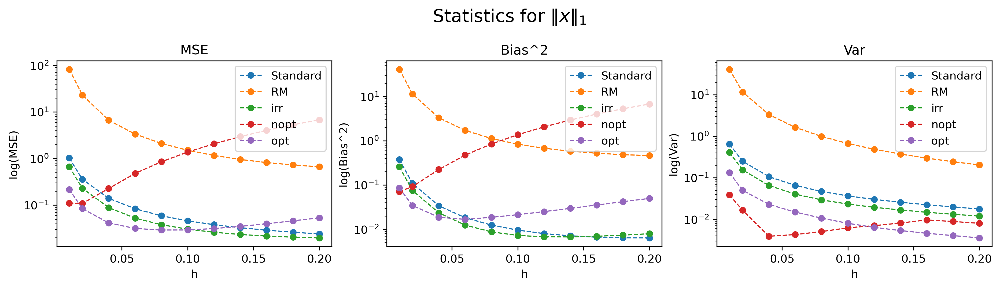

In [7]:
name = r'Statistics for $\|x\|_1$'
plot_statistics(firstmoment_abs_list, firstmoment_abs, h_list, methods, name)

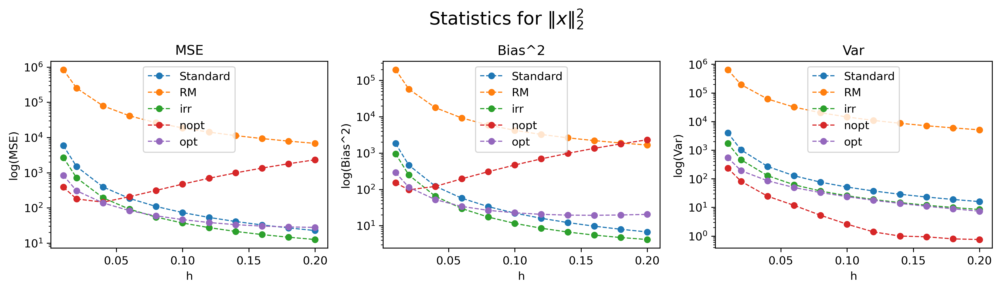

In [8]:
name = r'Statistics for $\|x\|^2_2$'
plot_statistics(secondmoment_list, secondmoment, h_list, methods, name)

In [9]:
secondmoment_list.shape

(11, 5, 128)

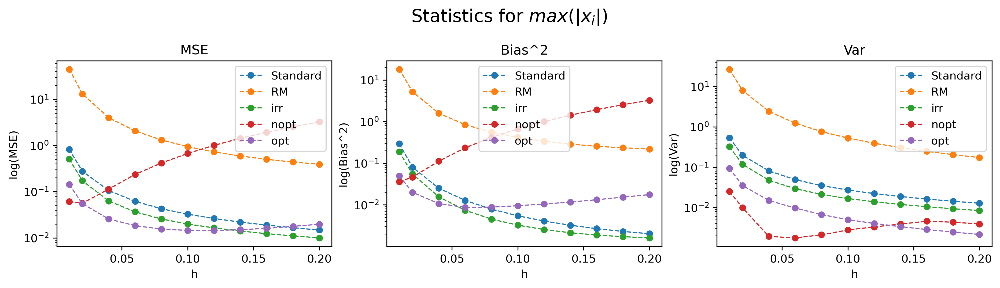

In [10]:
name = r'Statistics for $max(|x_i|)$'
plot_statistics(max_abs_list, max_abs, h_list, methods, name)

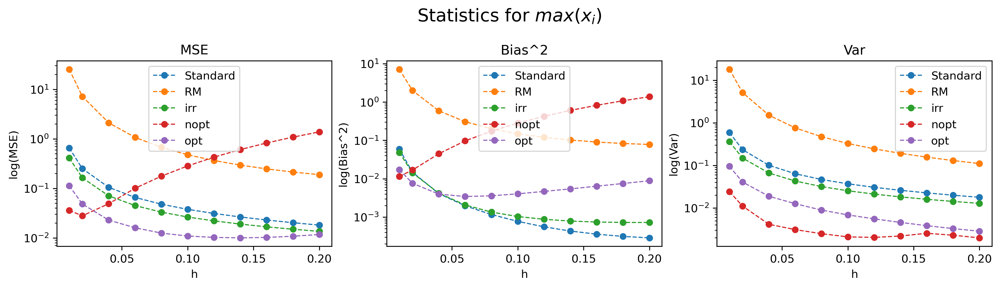

In [11]:
name = r'Statistics for $max(x_i)$'
plot_statistics(max_list, max_, h_list, methods, name)

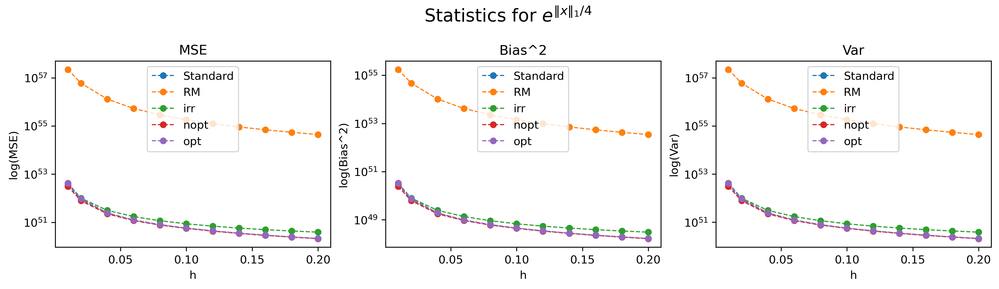

In [12]:
name = r'Statistics for $e^{\|x\|_1 / 4}$'
plot_statistics(exp4_list, exp4, h_list, methods, name)

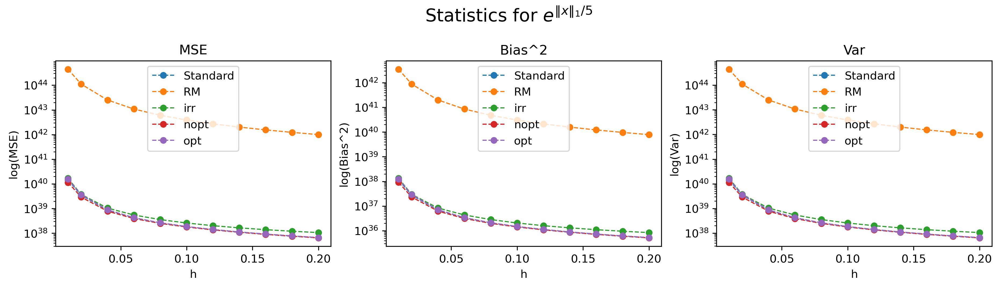

In [13]:
name = r'Statistics for $e^{\|x\|_1 / 5}$'
plot_statistics(exp5_list, exp5, h_list, methods, name)